In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from IPython.display import display, HTML
import ROI 
from track import*

### Experiment parameters:

In [2]:
period = 6  #Unit: s
acqTime = 0.2 #Unit: s

# Load file

In [3]:
fileName = '100mV_3sec_steps_200ms_470nm_4_MMStack_Pos0.ome'
filePath = '/Users/yungkuo/Google Drive/031617 Nanion bilayer analysis/'

movie size = (300, 2048, 2048)


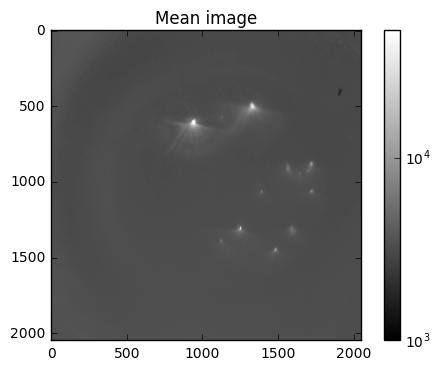

In [4]:
movie = load_tiff(filePath+fileName+'.tif', plot_mean=True, logNorm=True, vmin=1000, vmax=50000)

#### Exam some frames

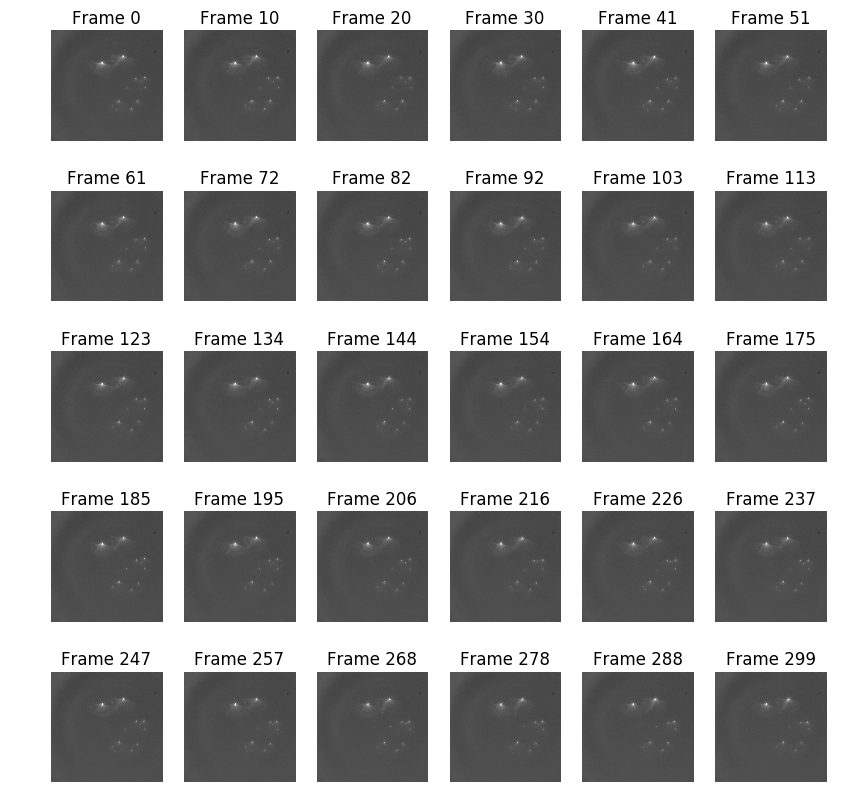

In [5]:
from matplotlib.colors import LogNorm
fig, ax = plt.subplots(5,6, figsize=(10,10))
ax = ax.ravel()
for count, i in enumerate(np.linspace(0, movie.shape[0]-1, 30)):
    i = int(i)
    ax[count].imshow(movie[i,:,:], cmap='gray', norm=LogNorm(vmin=1000, vmax=50000))
    ax[count].set_title('Frame %d' % i)
# Get rid of subplot frames 
for a in ax:
    a.patch.set_visible(False)
    a.axis('off')
plt.close(fig)
display(fig)

# Find dots

In [6]:
scan = [10,10]
pts = ROI.finddot(movie[0], scan, nstd=1.3)
pts = remove_duplicatePT(pts)

In [7]:
pts

array([[ 1322.,   502.],
       [  939.,   622.],
       [ 1713.,   884.],
       [ 1556.,   902.],
       [ 1639.,   947.],
       [ 1725.,  1065.],
       [ 1387.,  1067.],
       [ 1242.,  1315.],
       [ 1587.,  1316.],
       [ 1120.,  1397.],
       [ 1476.,  1452.],
       [ 1198.,  1469.]])

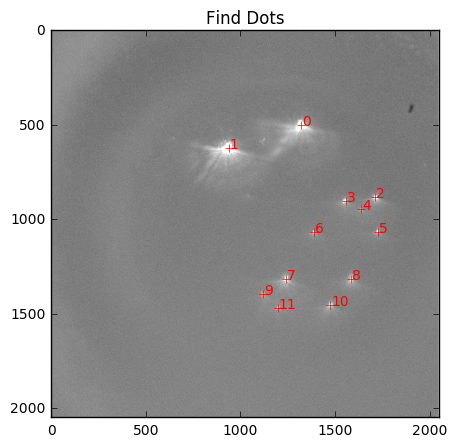

In [8]:
fig, ax = plt.subplots(figsize=(10,5))
ax.set_title('Find Dots')
for count, pt in enumerate(pts):
    ax.plot(pt[0],pt[1], 'r+')
    ax.annotate(count, xy=pt+[5,0], color='r')
ax.imshow(movie[0], cmap='gray', norm=LogNorm(vmin=1000, vmax=10000), interpolation='None')

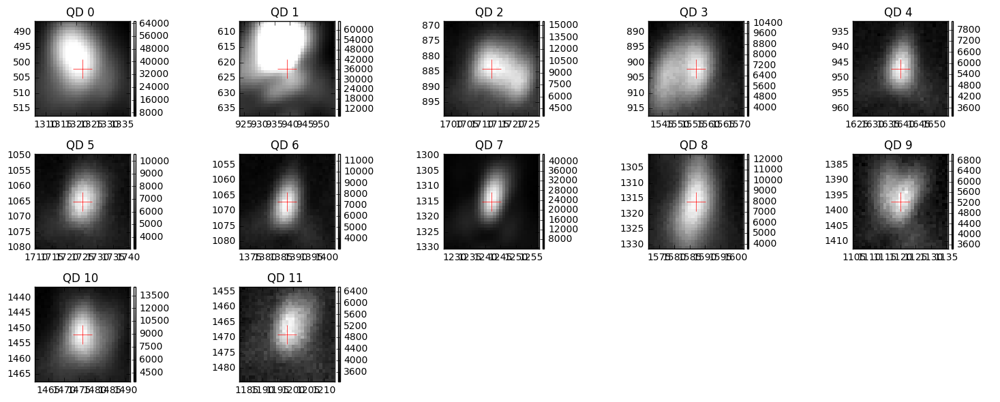

In [9]:
scan = [15,15]
fig, ax = plot_roi(movie[0], pts, scan, ncol=5)
display(fig)

# Single particle tracking

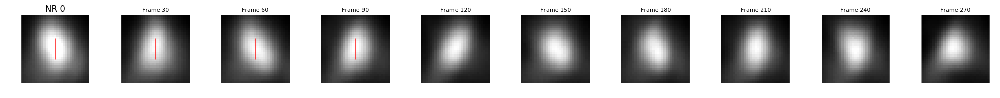

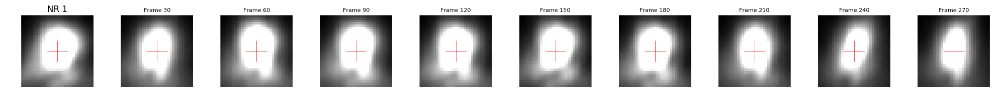

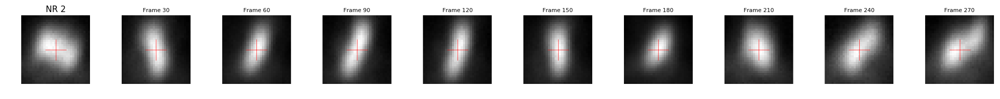

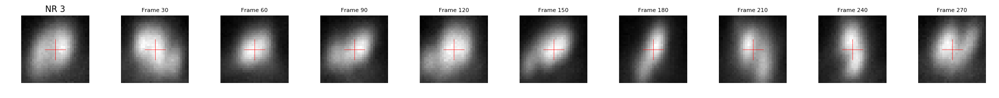

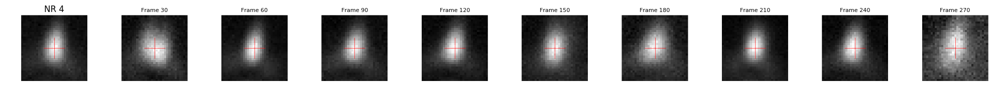

...

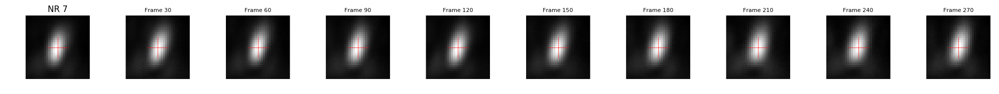

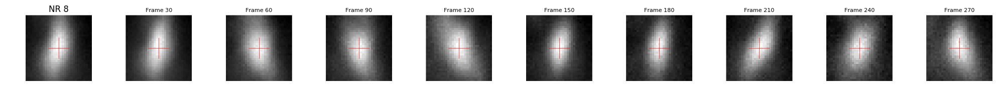

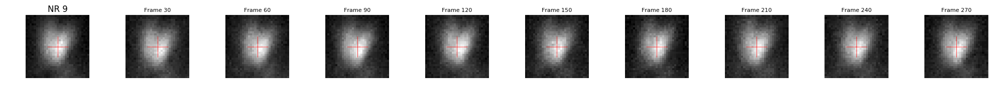

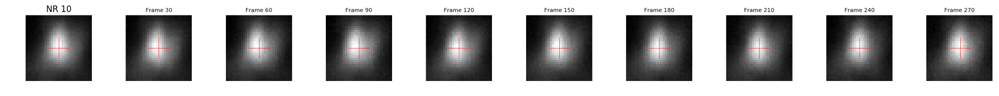

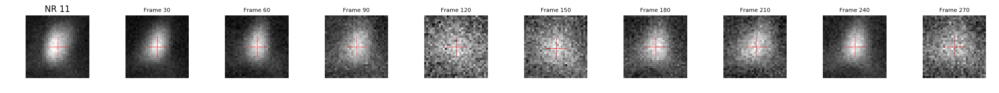

In [10]:
traj = {}
for count, pt in enumerate(pts):
    traj1 = get_trajectory(movie, pt, scan=(20,20), sigma=5, LP=True)
    traj[count] = traj1
    fig, axes = plot_roi_along_traj(movie, traj1, scan, d=30)
    axes[0].set_title('NR %d' % count)
    display(fig)

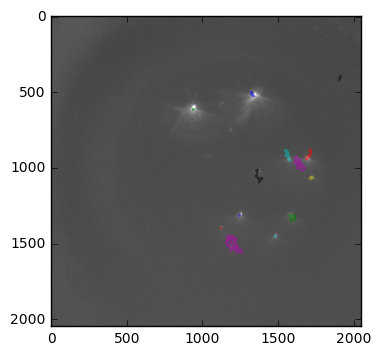

In [11]:
for count in range(len(pts)):
    plt.plot(traj[count][:,0], traj[count][:,1], alpha=0.5)
    plt.imshow(movie[-1], cmap='gray', norm=LogNorm(vmin=1000, vmax=50000))

In [12]:
playmovie = True
if playmovie:
    ANI = {}
    for count in range(len(pts)):
        ani = play_movie(movie, traj[count], scan=(40,40), title='NR %d' % count, framerate=1/0.2*10)
        ANI[count] = ani

In [13]:
count = 8
HTML(ANI[count].to_html5_video())

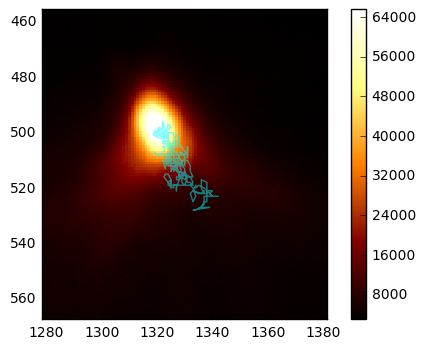

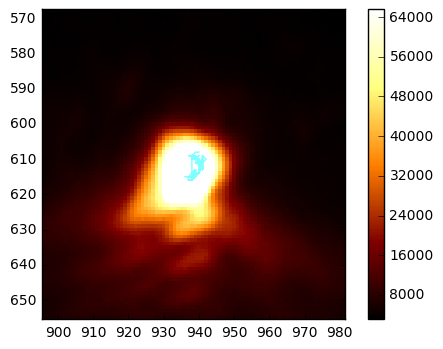

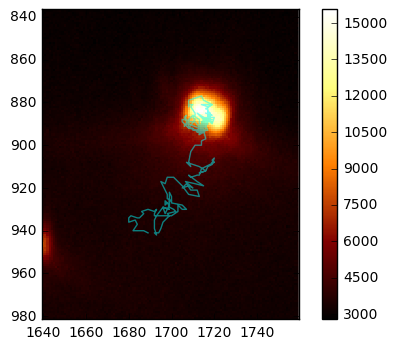

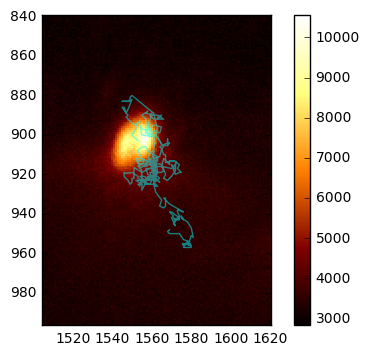

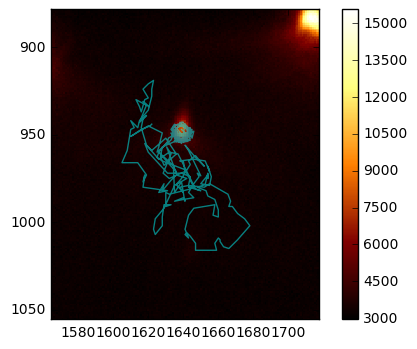

...

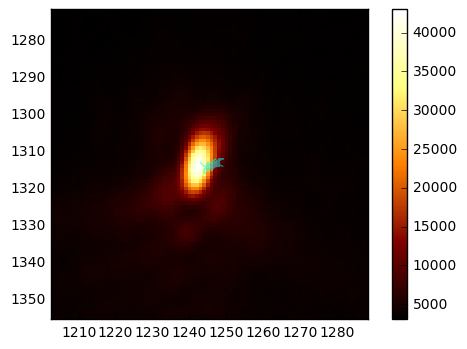

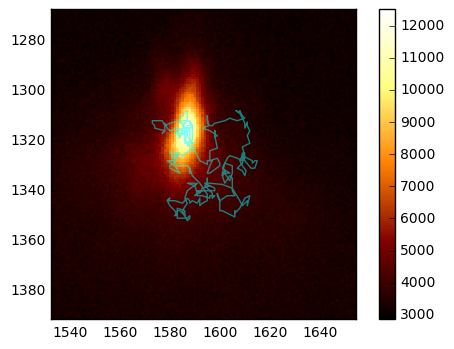

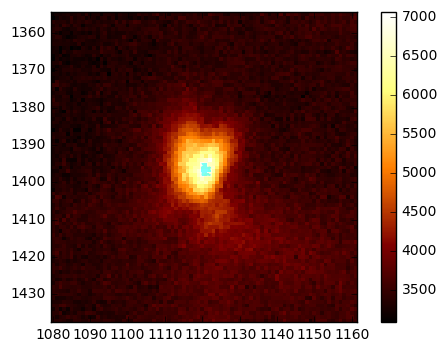

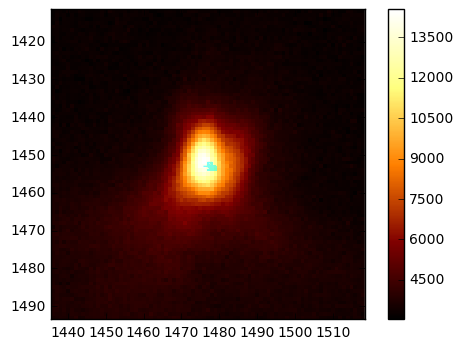

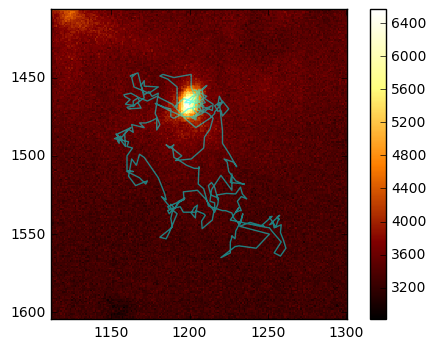

In [14]:
for count, pt in enumerate(pts):
    fig = plot_diffusion_traj(movie, traj[count])
    display(fig)

# Test threshold mask

In [15]:
scan

[15, 15]

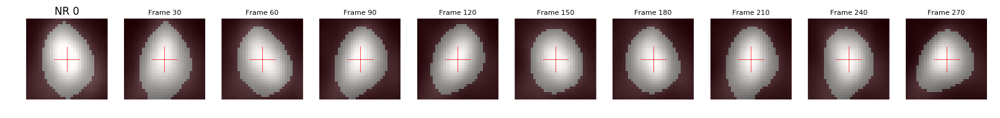

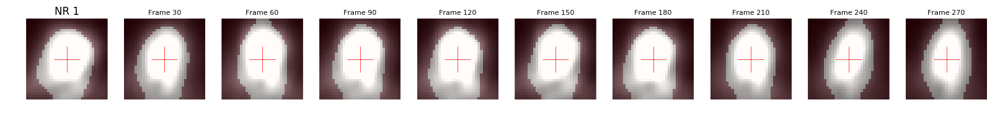

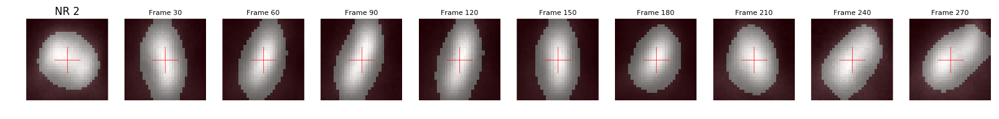

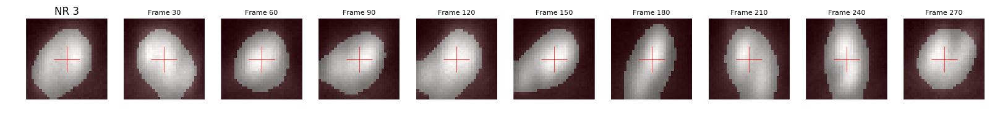

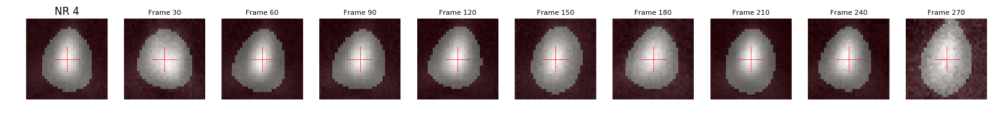

...

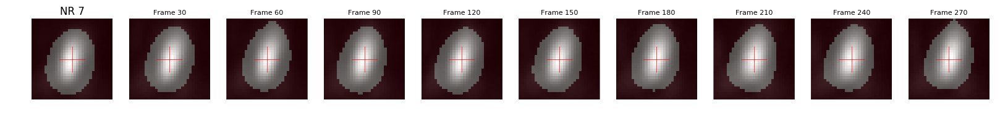

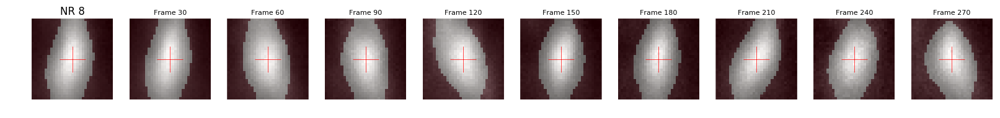

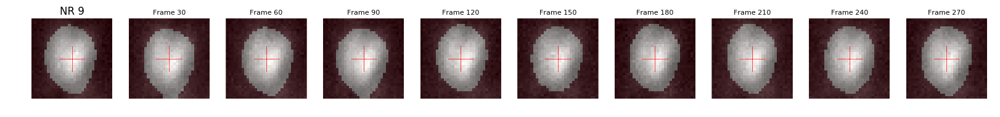

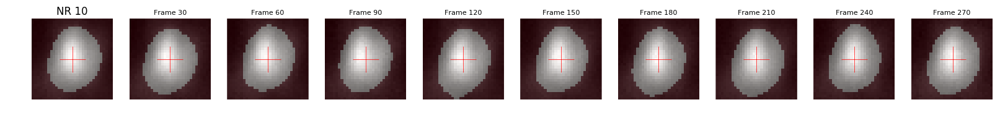

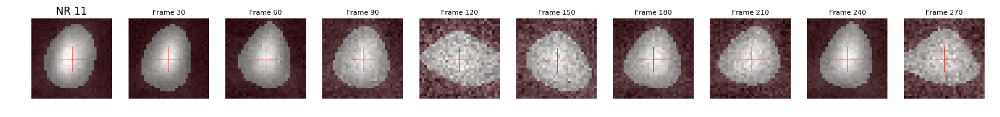

In [16]:
d = 30
for count, pt in enumerate(pts):
    fig, axes = plot_mask_along_traj(movie, traj[count], scan, d, threshold='smooth')
    axes[0].set_title('NR %d' % count)
    display(fig)

# Extract fluorescence time trace, F(t)

In [17]:
scan

[15, 15]

In [18]:
T = np.arange(0, movie.shape[0]*acqTime, acqTime)
V = gen_V_trace(period=period, V0=100, V1=-100, x=T, shift=0)
tt = {}
for count, pt in enumerate(pts):
    tt[count] = get_tt_along_traj(movie, traj[count], scan, threshold='smooth')

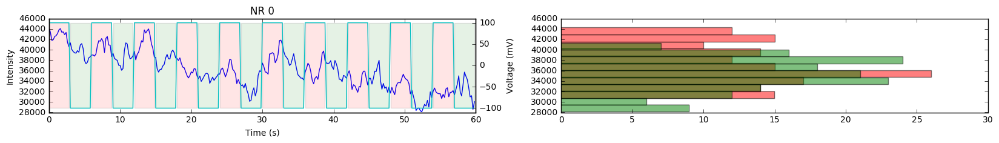

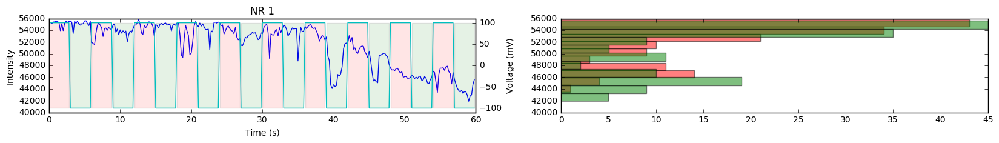

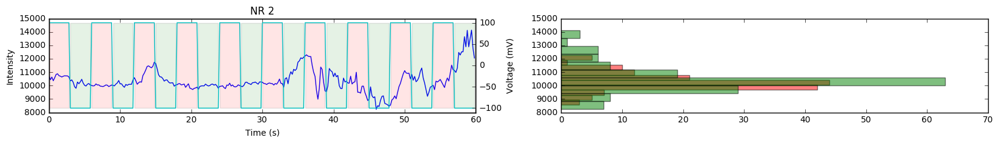

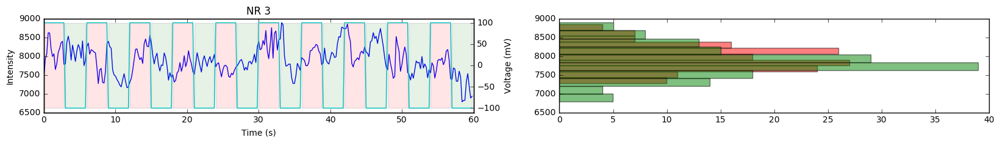

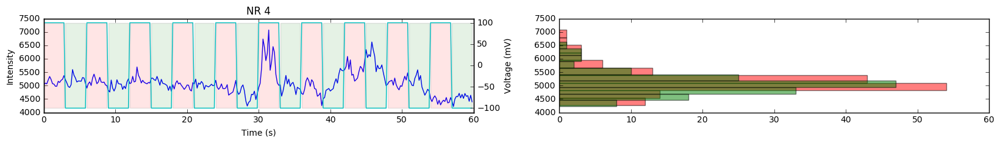

...

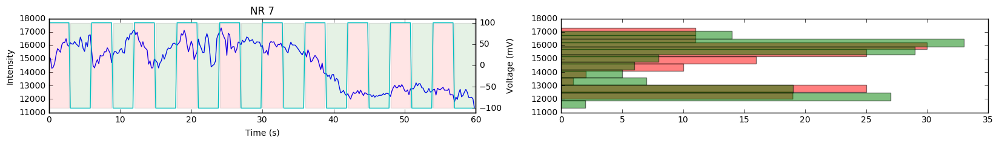

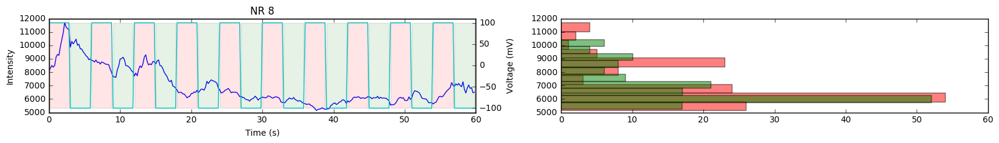

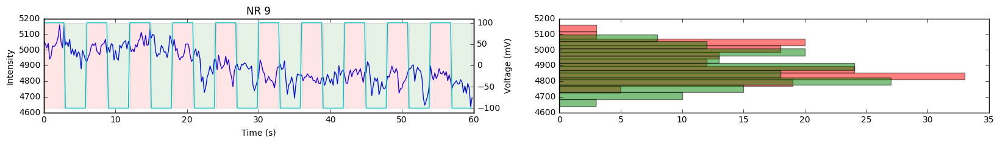

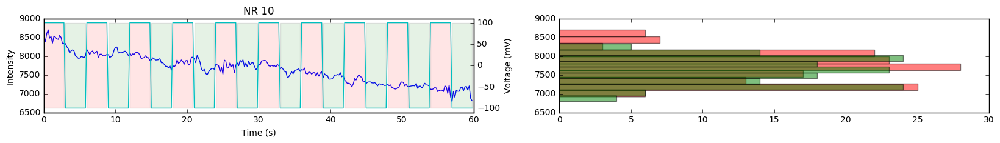

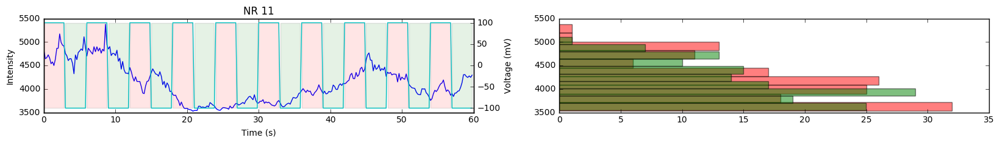

In [19]:
for count, pt in enumerate(pts):
    fig, ax = plt.subplots(1,2, figsize=(20,2))
    ax[0].plot(T, tt[count], label='smooth mask')
    #plt.plot(T, get_tt_along_traj(movie, traj[count], scan, threshold='median'), label='median')
    #plt.plot(T, get_tt_along_traj(movie, traj[count], scan, threshold='smooth'), label='smooth')
    #plt.legend(frameon=False)
    ax[0].set_ylabel('Intensity')
    ax[0].set_xlabel('Time (s)')
    axt = ax[0].twinx()
    axt.plot(T,V, 'c')
    axt.set_ylim(-110,110)
    axt.set_ylabel('Voltage (mV)')
    axt.set_title('NR %d' % count)
    axt.fill_between(T, -100, 100, where=V == -100, facecolor='g', alpha=0.1)
    axt.fill_between(T, -100, 100, where=V == 100, facecolor='r', alpha=0.1)
    
    
    bins = np.linspace(tt[count].min(), tt[count].max(), 25)
    ax[1].hist(tt[count][V==100], color='r', orientation='horizontal', alpha=0.5)
    ax[1].hist(tt[count][V==-100], color='g', orientation='horizontal', alpha=0.5)

# $\hat F(\omega)$ using FFT (doesn't work! Total acquisition time is too short.)

#### period = 6s -> frequency = 0.167Hz marked by vertical line

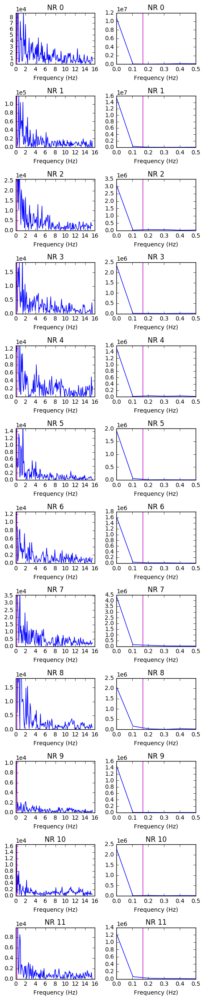

In [20]:
import math
fig, ax = plt.subplots(len(pts), 2, figsize=(5, len(pts)*2))
for count, pt in enumerate(pts):
    for i in range(2):
        ax[count,i].plot(get_fft(tt[count], T)[0], get_fft(tt[count], T)[1])
        ax[count,i].set_xlabel('Frequency (Hz)')
        ax[count,i].set_title('NR %d' % count)
        ax[count,i].ticklabel_format(style='sci', axis='y', scilimits=(0,0))
        ax[count,i].axvline(x=1/period, color='m')
    ymax = np.mean(get_fft(tt[count], T)[1])
    ax[count,0].set_ylim(0,ymax)
    ax[count,1].set_xlim(0,0.5)
fig.tight_layout()

# Filter $F(t)$ with high pass Gaussian filter

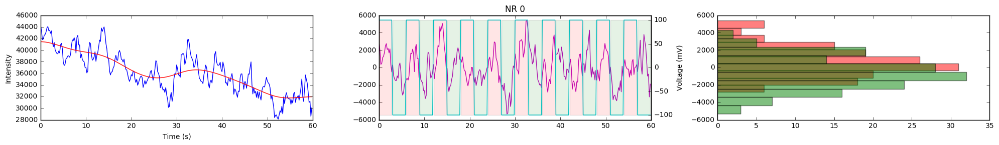

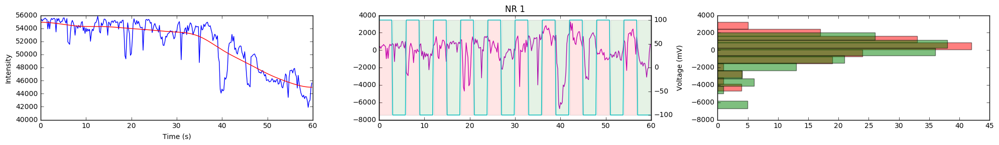

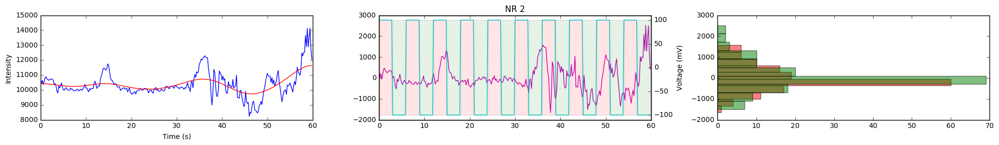

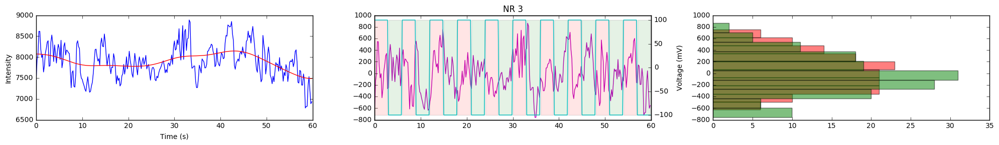

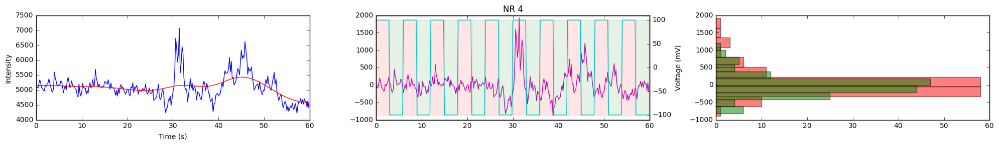

...

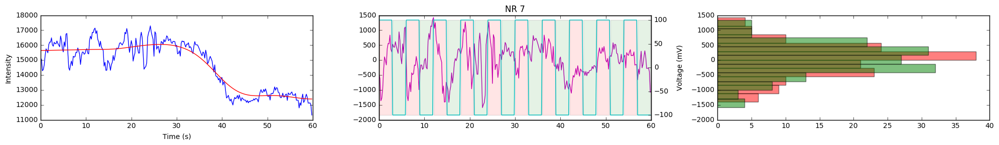

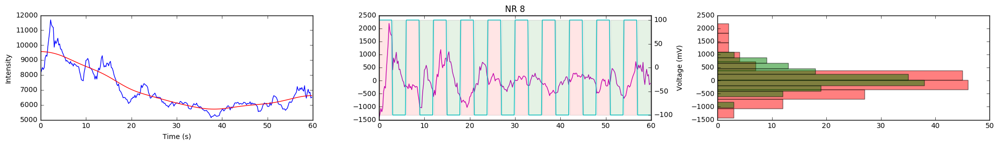

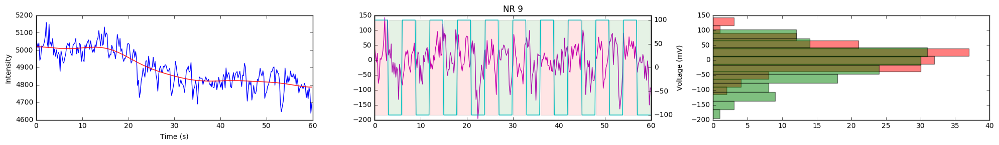

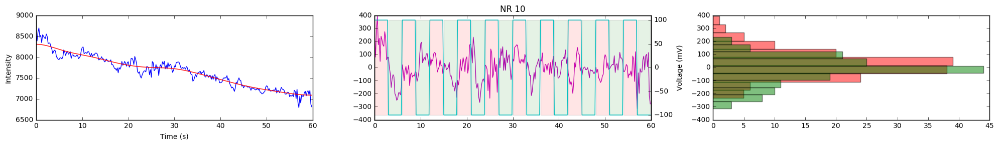

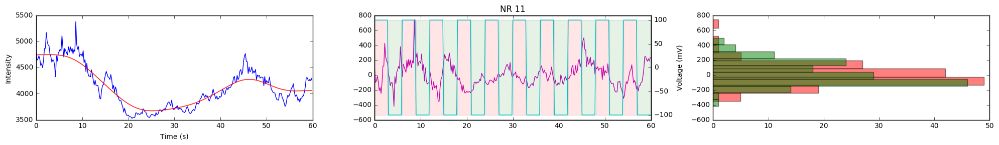

In [21]:
for count, pt in enumerate(pts):
    L = ndi.gaussian_filter1d(tt[count], sigma=20)
    fig, ax = plt.subplots(1,3, figsize=(20,3))
    ax[0].plot(T, tt[count], label='smooth mask')
    ax[0].plot(T, L, 'r')
    ax[0].set_ylabel('Intensity')
    ax[0].set_xlabel('Time (s)')
    
    ax[1].plot(T, tt[count]-L, 'm')
    axt = ax[1].twinx()
    axt.plot(T,V, 'c')
    axt.set_ylim(-110,110)
    axt.set_ylabel('Voltage (mV)')
    axt.set_title('NR %d' % count)
    axt.fill_between(T, -100, 100, where=V == -100, facecolor='g', alpha=0.1)
    axt.fill_between(T, -100, 100, where=V == 100, facecolor='r', alpha=0.1)
    
    bins = np.linspace(tt[count].min(), tt[count].max(), 25)
    ax[2].hist((tt[count]-L)[V==100], color='r', orientation='horizontal', alpha=0.5)
    ax[2].hist((tt[count]-L)[V==-100], color='g', orientation='horizontal', alpha=0.5)
    fig.tight_layout()

# Histogram of $F(V-)$ and $F(V+)$ with n frame shift

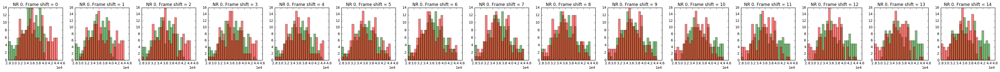

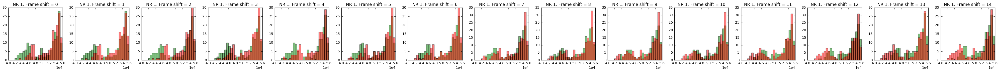

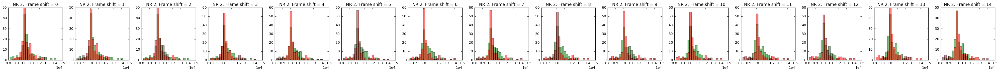

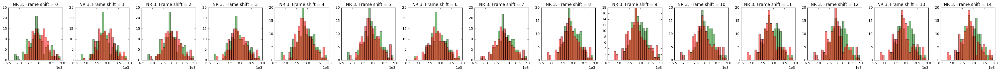

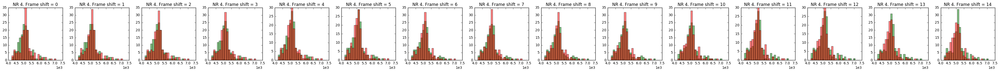

...

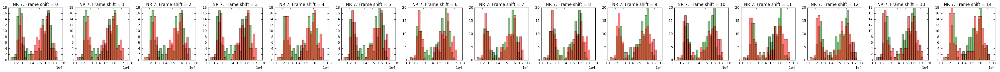

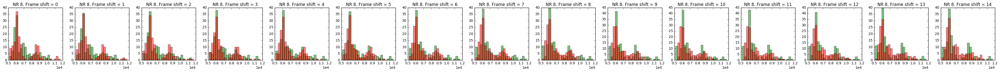

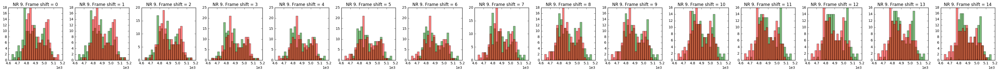

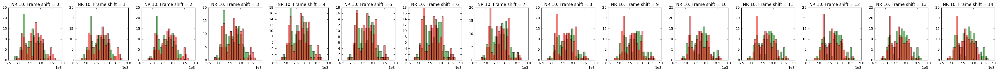

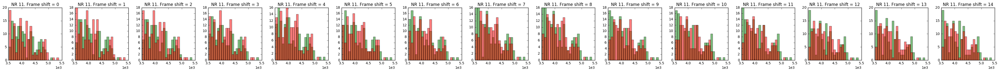

In [22]:
for count in range(len(pts)):
    fig, ax = plt.subplots(1, int(period/2/acqTime), figsize=(40,3))
    ax = ax.ravel()
    for shift in range(int(period/2/acqTime)):
        tt1 = np.roll(tt[count], shift)
        Vn = tt1[V==-100]
        Vp = tt1[V==100]
        bins = np.linspace(tt1.min(), tt1.max(), 25)
        ax[shift].hist(Vn, bins=bins, color='g', alpha=0.5)
        ax[shift].hist(Vp, bins=bins, color='r', alpha=0.5)
        ax[shift].set_title('NR %d. Frame shift = %d' % (count, shift))
        ax[shift].ticklabel_format(style='sci', axis='x', scilimits=(0,0))
    fig.tight_layout()
    plt.close(fig)
    display(fig)

# Histogram of $F(V-)_(highpassed)$ and $F(V+)_(highpassed)$ with n frame shift

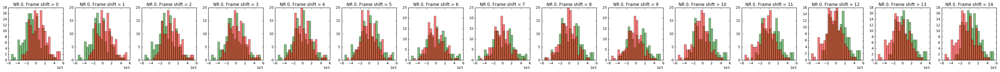

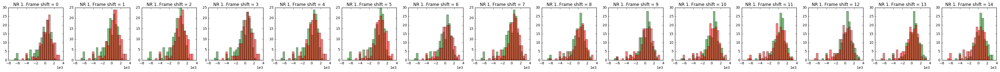

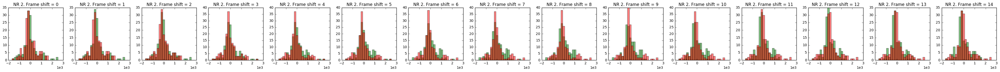

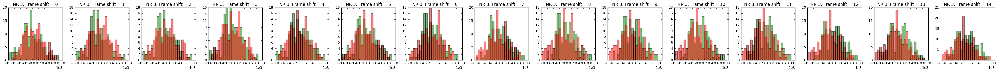

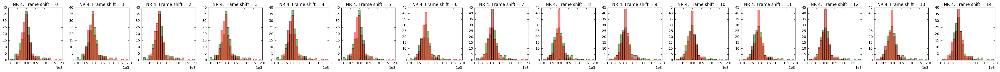

...

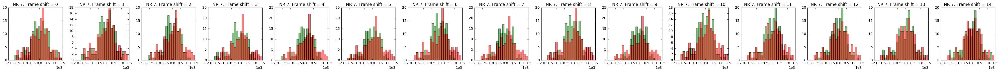

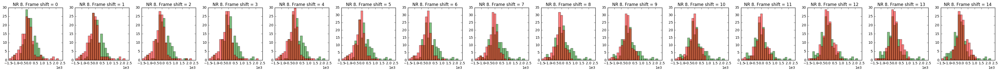

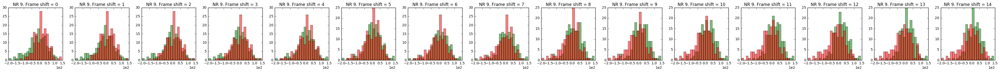

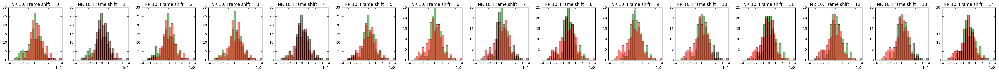

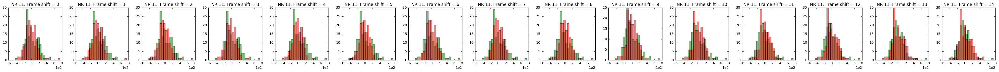

In [23]:
for count in range(len(pts)):
    L = ndi.gaussian_filter1d(tt[count], sigma=20)
    fig, ax = plt.subplots(1, int(period/2/acqTime), figsize=(40,3))
    ax = ax.ravel()
    for shift in range(int(period/2/acqTime)):
        tt1 = np.roll(tt[count]-L, shift)
        Vn = tt1[V==-100]
        Vp = tt1[V==100]
        bins = np.linspace(tt1.min(), tt1.max(), 25)
        ax[shift].hist(Vn, bins=bins, color='g', alpha=0.5)
        ax[shift].hist(Vp, bins=bins, color='r', alpha=0.5)
        ax[shift].set_title('NR %d. Frame shift = %d' % (count, shift))
        ax[shift].ticklabel_format(style='sci', axis='x', scilimits=(0,0))
    fig.tight_layout()
    plt.close(fig)
    display(fig)

# $<F(V-)> - <F(V+)>$ as function of frame shift

In [24]:
dF_mean = pd.DataFrame()
for count in range(len(pts)):
    for shift in range(movie.shape[0]): #int(period/2/acqTime)):
        tt1 = tt[count][shift:]
        Vn = tt1[V[:-shift]==-100]
        Vp = tt1[V[:-shift]==100]
        if Vn.shape[-1] >0 and Vp.shape[-1] >0:
            df1 = np.mean(Vn)-np.mean(Vp)
            dF_mean1 = pd.DataFrame({'df':df1, 'VnStd': np.std(Vn, ddof=1), 'VpStd': np.std(Vp, ddof=1), 'shift':shift}, 
                                    index=[count])
            dF_mean = dF_mean.append(dF_mean1)

/Users/yungkuo/anaconda/lib/python3.5/site-packages/numpy/core/_methods.py:82: RuntimeWarning: Degrees of freedom <= 0 for slice
  warnings.warn("Degrees of freedom <= 0 for slice", RuntimeWarning)


In [25]:
#print(dF_mean[:5])
#print(len(dF_mean))

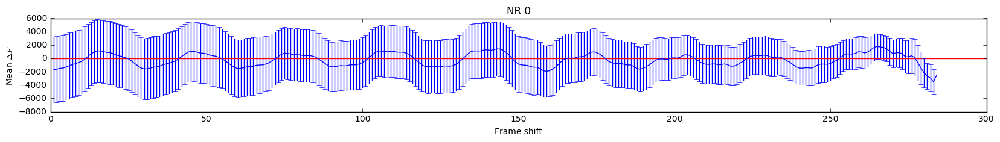

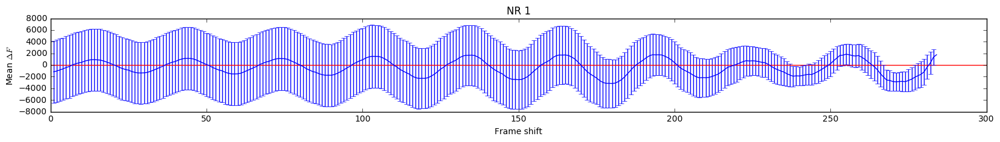

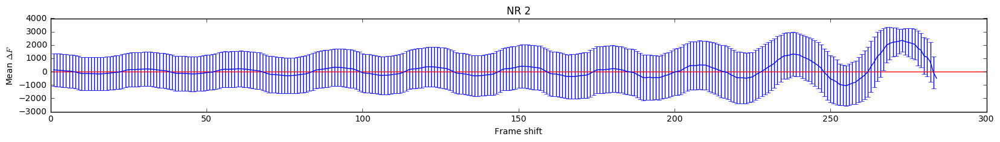

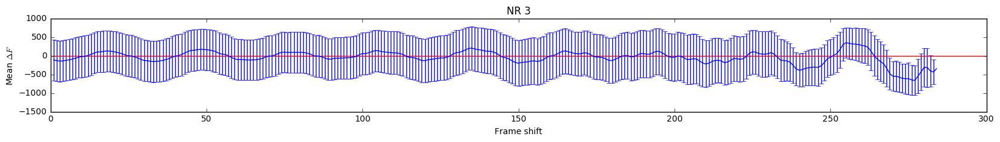

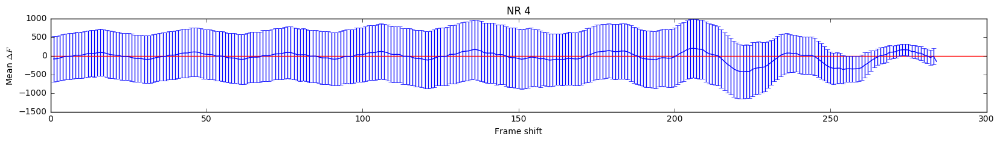

...

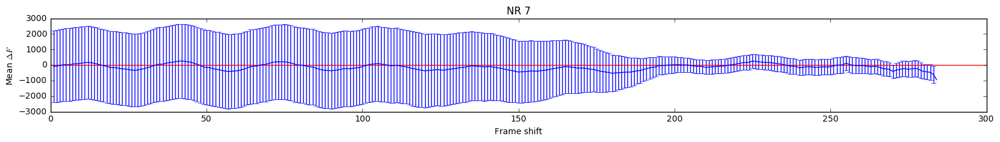

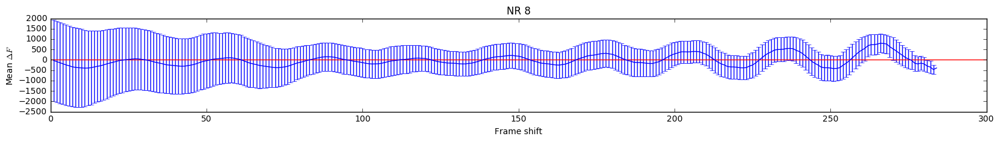

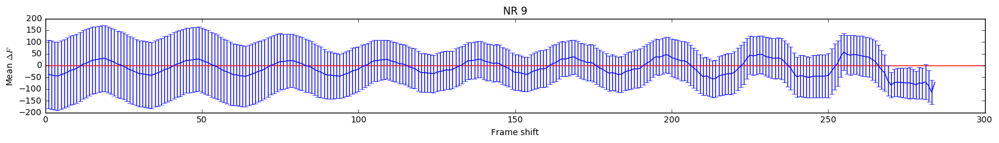

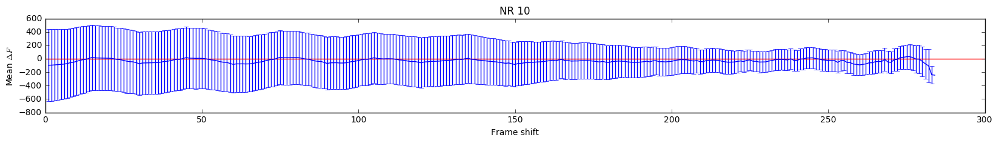

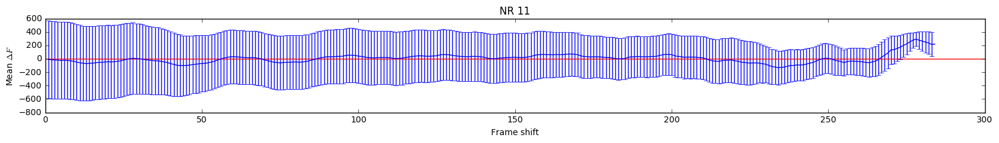

In [26]:
for count in range(len(pts)):
    plt.figure(figsize=(20,2))
    err = np.sqrt(dF_mean.loc[count]['VnStd']**2 + dF_mean.loc[count]['VpStd']**2)
    plt.errorbar(x=dF_mean.loc[count]['shift'], y=dF_mean.loc[count]['df'], yerr=err)
    plt.title('NR %d' % count)
    plt.hlines(y=0, xmin=0, xmax=movie.shape[0], color='r')
    plt.ylabel('Mean $\Delta F$')
    plt.xlabel('Frame shift')

# $\frac{<F(V-)> - <F(V+)>}{<F>}$ as function of frame shift

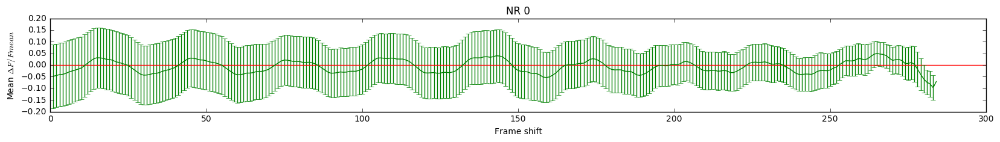

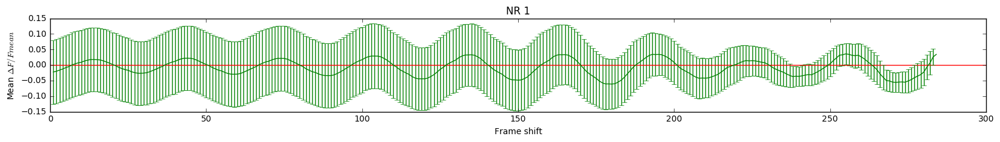

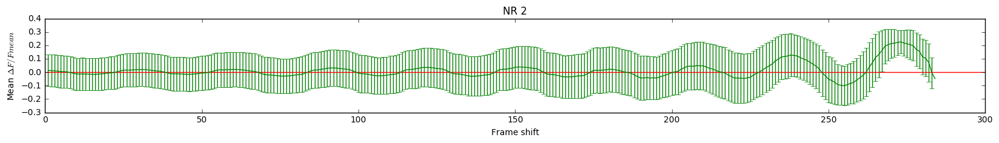

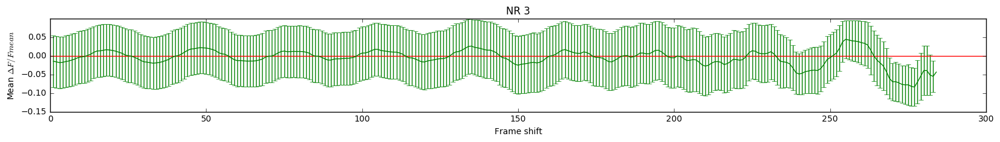

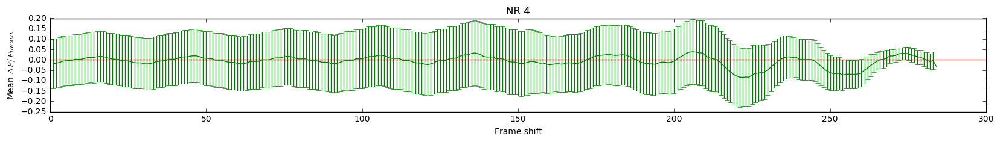

...

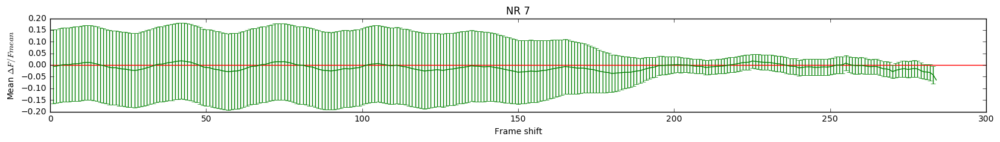

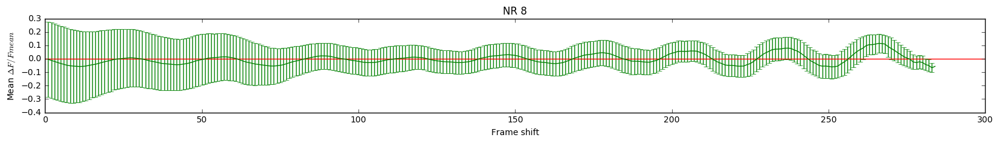

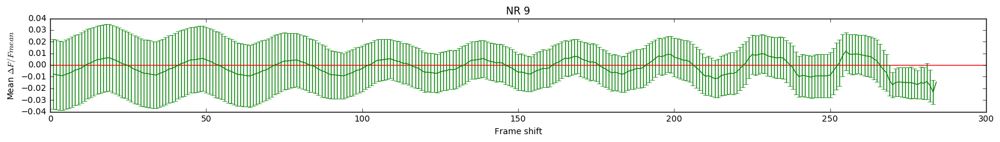

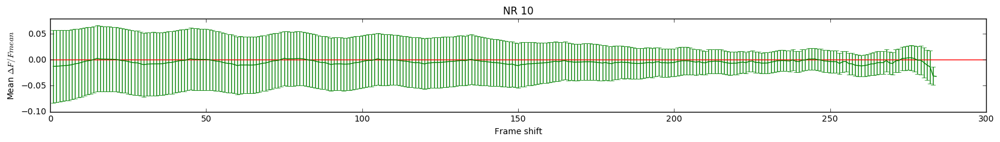

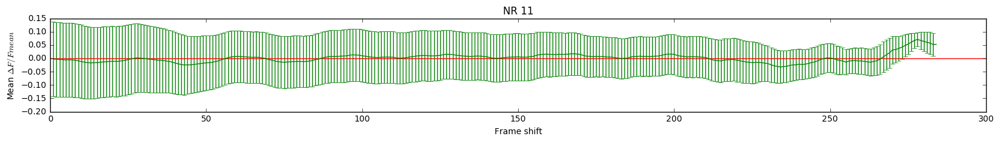

In [27]:
for count in range(len(pts)):
    plt.figure(figsize=(20,2))
    PerrdF = np.sqrt(dF_mean.loc[count]['VnStd']**2 + dF_mean.loc[count]['VpStd']**2)/dF_mean.loc[count]['df']
    PerrF = np.std(tt[count], ddof=1)/tt[count].mean()
    err = np.sqrt(PerrdF**2 + PerrF**2)*dF_mean.loc[count]['df']/tt[count].mean()
    plt.errorbar(x=dF_mean.loc[count]['shift'], y=dF_mean.loc[count]['df']/tt[count].mean(), yerr=err, c='g')
    plt.title('NR %d' % count)
    plt.hlines(y=0, xmin=0, xmax=movie.shape[0], color='r')
    plt.ylabel('Mean $\Delta F/Fmean$')
    plt.xlabel('Frame shift')

# Background analysis

#### Select random points in central 1/2 region 

In [28]:
bg_pts = np.zeros(pts.shape)
bg_pts[:,0] = np.random.rand(len(bg_pts))*movie.shape[2]/2+movie.shape[2]/4
bg_pts[:,1] = np.random.rand(len(bg_pts))*movie.shape[1]/2+movie.shape[1]/4

In [29]:
bg_pts = np.array([[  934.55724997,  1167.60454828],
       [ 1354.68017369,  1414.07052021],
       [  576.43139977,  1215.27274967],
       [  641.50867725,  1428.98988551],
       [  707.23914875,  1323.99489218],
       [  607.52033926,   580.17152156],
       [  712.64886882,  1399.38803776],
       [ 1008.41275333,  1416.57791504],
       [  630.11228718,  1238.49560479],])

In [30]:
#bg_pts = np.array([[ 900.10946339,  1158.70070604]])

In [31]:
scan = [15,15]

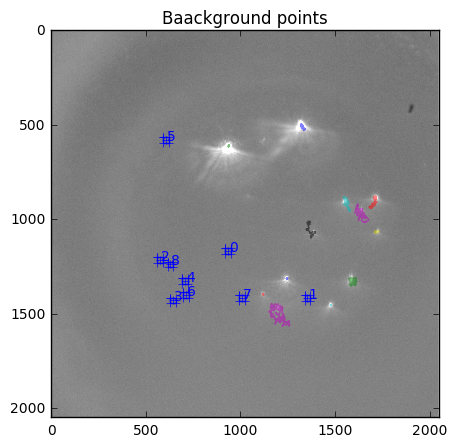

In [32]:
fig, ax = plt.subplots(figsize=(10,5))
ax.set_title('Baackground points')
for count, pt in enumerate(bg_pts):
    ax.plot(pt[0],pt[1], 'b+')
    ax.annotate(count, xy=pt+[5,0], color='b')
    box = np.array([[pt[0]-scan[1],pt[1]-scan[0]],
                    [pt[0]+scan[1]+1,pt[1]-scan[1]],
                    [pt[0]+scan[1]+1,pt[1]+scan[1]+1],
                    [pt[0]-scan[1],pt[1]+scan[0]+1],
                    [pt[0]-scan[1],pt[1]-scan[0]]])
    ax.plot(box[:,0], box[:,1], 'b+-')
for count in range(len(pts)):
    plt.plot(traj[count][:,0], traj[count][:,1], alpha=0.5)
ax.imshow(movie[0], cmap='gray', norm=LogNorm(vmin=1000, vmax=10000), interpolation='None')

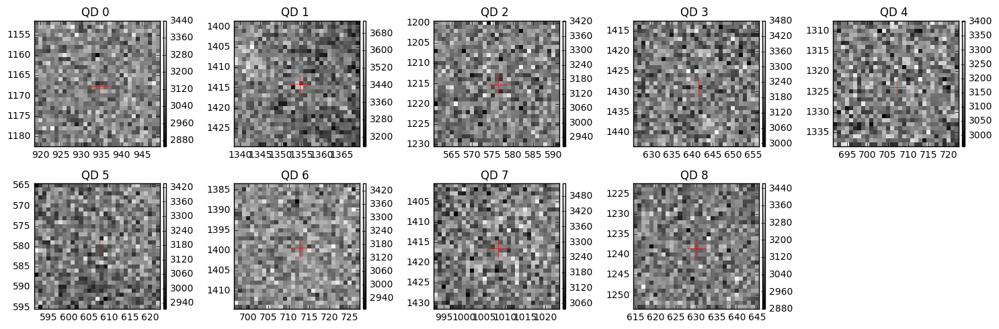

In [33]:
fig, ax = plot_roi(movie[0], bg_pts, scan, ncol=5)
#fig.set_size_inches((10,10))
display(fig)

# Extract background time trace, $F_b(t)$

In [34]:
bg_tt = {}
for count, pt in enumerate(bg_pts):
    tj = np.tile(pt, movie.shape[0]).reshape(traj[count].shape)
    bg_tt[count] = get_tt_along_traj(movie, tj, scan, threshold=0)

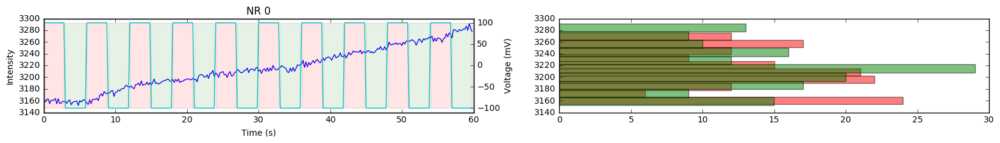

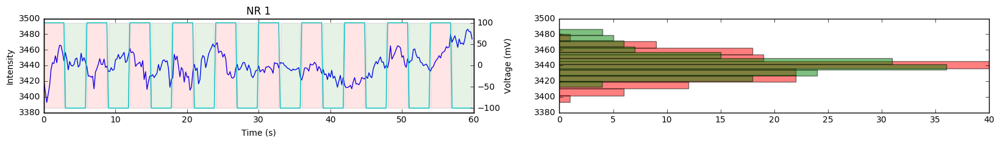

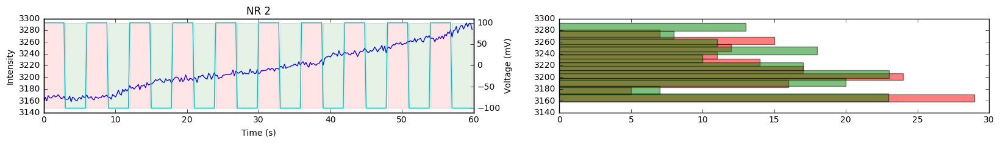

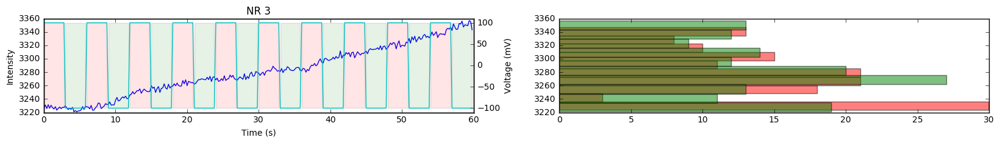

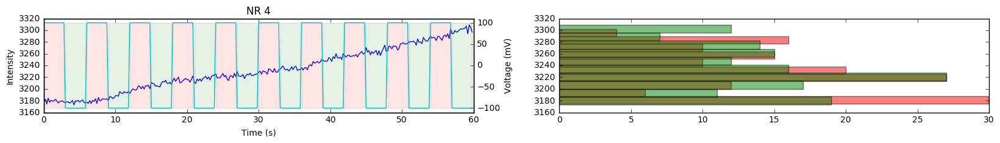

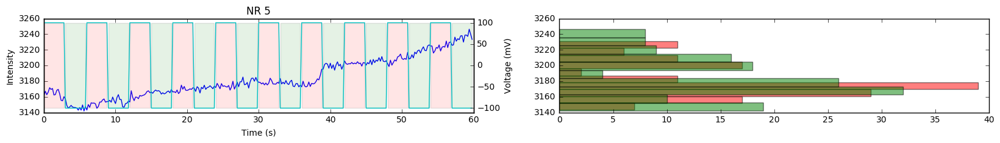

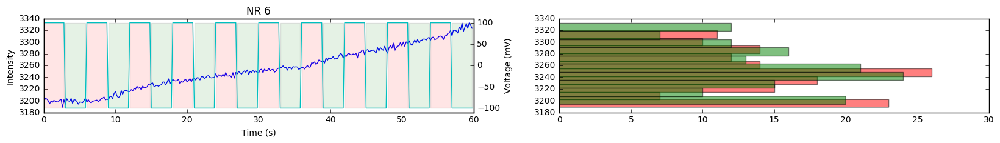

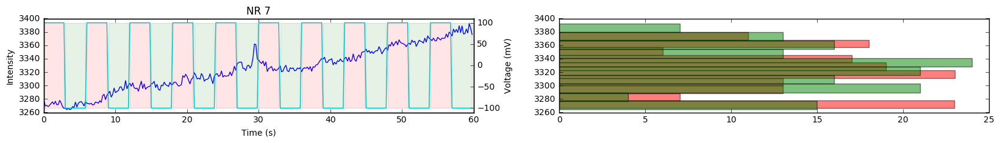

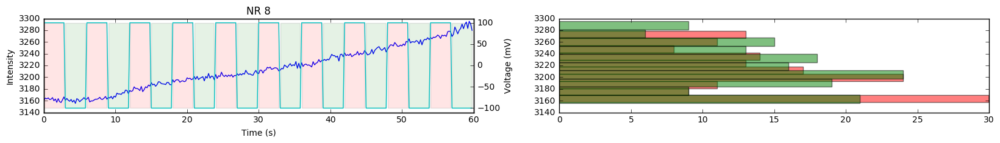

In [35]:
for count, pt in enumerate(bg_pts):
    fig, ax = plt.subplots(1,2, figsize=(20,2))
    ax[0].plot(T, bg_tt[count], label='smooth mask')
    ax[0].set_ylabel('Intensity')
    ax[0].set_xlabel('Time (s)')
    axt = ax[0].twinx()
    axt.plot(T,V, 'c')
    axt.set_ylim(-110,110)
    axt.set_ylabel('Voltage (mV)')
    axt.set_title('NR %d' % count)
    axt.fill_between(T, -100, 100, where=V == -100, facecolor='g', alpha=0.1)
    axt.fill_between(T, -100, 100, where=V == 100, facecolor='r', alpha=0.1)
    
    
    bins = np.linspace(tt[count].min(), tt[count].max(), 25)
    ax[1].hist(bg_tt[count][V==100], color='r', orientation='horizontal', alpha=0.5)
    ax[1].hist(bg_tt[count][V==-100], color='g', orientation='horizontal', alpha=0.5)

# Histogram of $F_b(V-)$ and $F_b(V+)$ with n frame shift

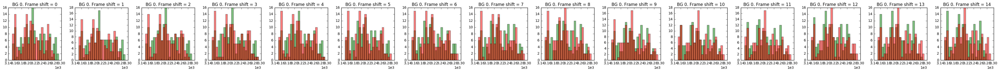

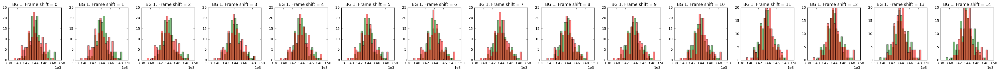

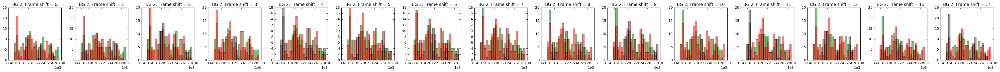

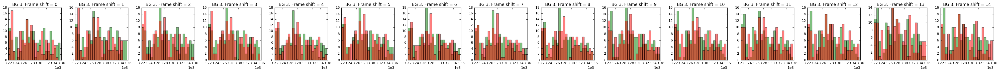

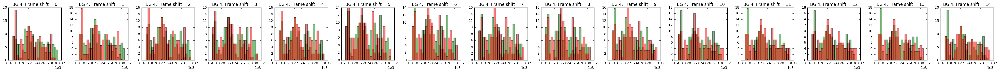

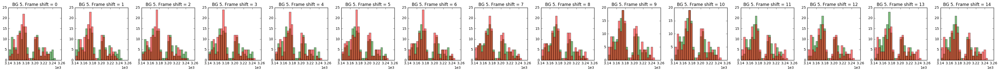

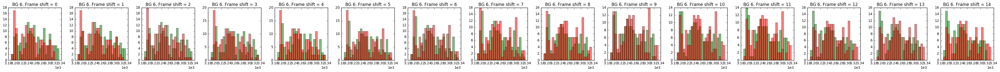

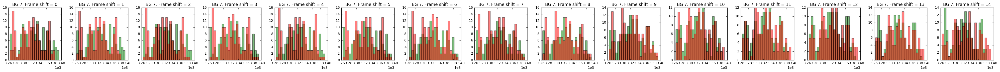

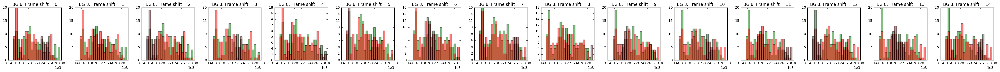

In [36]:
for count in range(len(bg_pts)):
    fig, ax = plt.subplots(1, int(period/2/acqTime), figsize=(40,3))
    ax = ax.ravel()
    for shift in range(int(period/2/acqTime)):
        tt1 = np.roll(bg_tt[count], shift)
        Vn = tt1[V==-100]
        Vp = tt1[V==100]
        bins = np.linspace(tt1.min(), tt1.max(), 25)
        ax[shift].hist(Vn, bins=bins, color='g', alpha=0.5)
        ax[shift].hist(Vp, bins=bins, color='r', alpha=0.5)
        ax[shift].set_title('BG %d. Frame shift = %d' % (count, shift))
        ax[shift].ticklabel_format(style='sci', axis='x', scilimits=(0,0))
    fig.tight_layout()
    plt.close(fig)
    display(fig)

# $<F_b(V-)> - <F_b(V+)>$ as function of frame shift

In [37]:
bg_dF_mean = pd.DataFrame()
for count in range(len(bg_pts)):
    for shift in range(movie.shape[0]): #int(period/2/acqTime)):
        tt1 = bg_tt[count][shift:]
        Vn = tt1[V[:-shift]==-100]
        Vp = tt1[V[:-shift]==100]
        if Vn.shape[-1] >0 and Vp.shape[-1] >0:
            df1 = np.mean(Vn)-np.mean(Vp)
            bg_dF_mean1 = pd.DataFrame({'df':df1, 'VnStd': np.std(Vn, ddof=1), 'VpStd': np.std(Vp, ddof=1), 'shift':shift}, 
                                    index=[count])
            bg_dF_mean = bg_dF_mean.append(bg_dF_mean1)

/Users/yungkuo/anaconda/lib/python3.5/site-packages/numpy/core/_methods.py:82: RuntimeWarning: Degrees of freedom <= 0 for slice
  warnings.warn("Degrees of freedom <= 0 for slice", RuntimeWarning)


In [38]:
print(bg_dF_mean[:5])
print(dF_mean[:5])

       VnStd      VpStd        df  shift
0  36.413458  35.055176  6.262039      1
0  36.265111  35.069184  5.765320      2
0  35.985710  35.281278  4.834584      3
0  35.915687  35.248430  4.296348      4
0  35.494153  35.452348  3.967768      5
         VnStd        VpStd           df  shift
0  3241.047203  3740.847846 -1734.209231      1
0  3216.592918  3748.275028 -1630.962709      2
0  3207.155934  3765.542372 -1493.994188      3
0  3202.497985  3756.775919 -1452.151940      4
0  3206.788940  3751.234821 -1309.893308      5


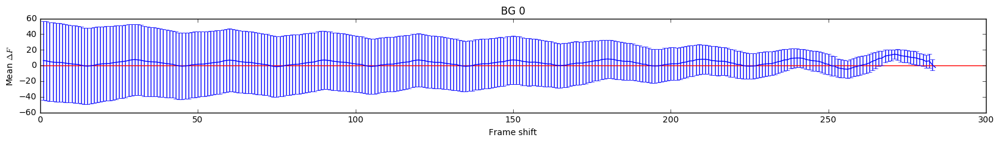

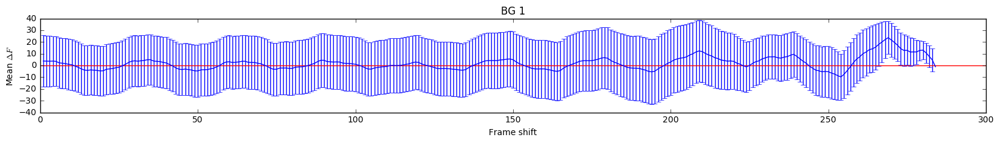

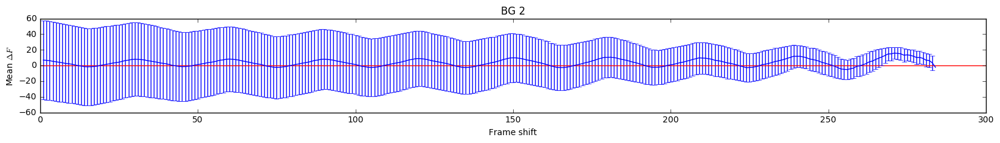

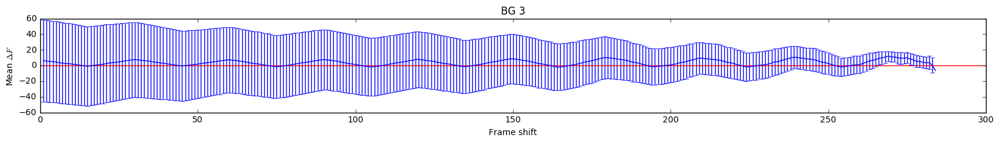

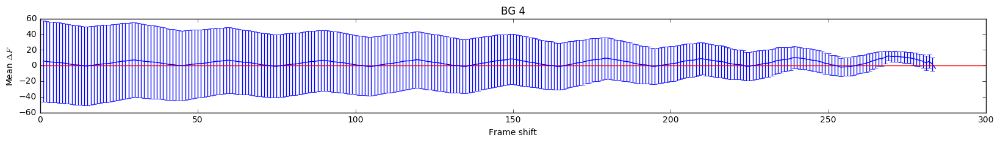

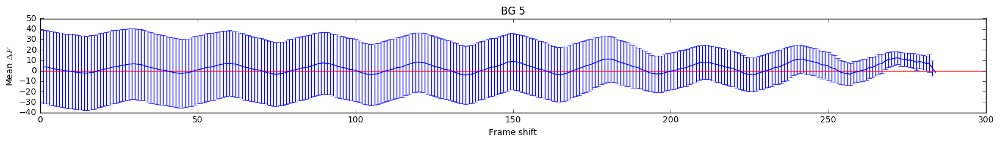

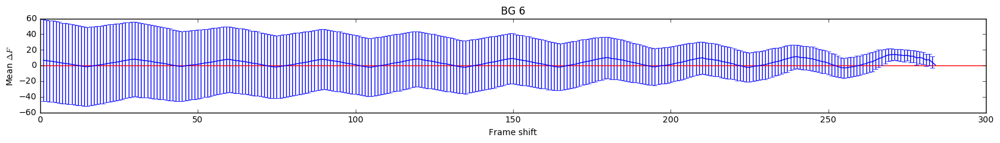

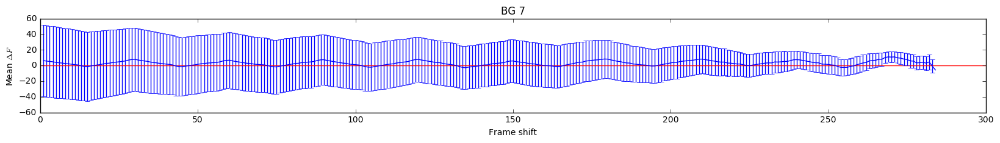

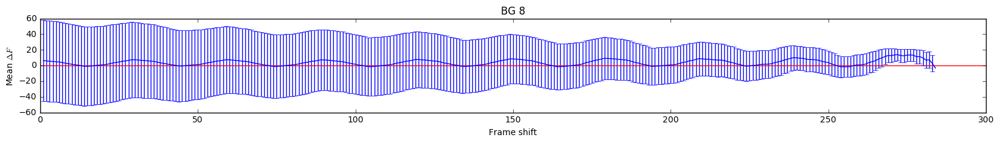

In [39]:
for count in range(len(bg_pts)):
    plt.figure(figsize=(20,2))
    err = np.sqrt(bg_dF_mean.loc[count]['VnStd']**2 + bg_dF_mean.loc[count]['VpStd']**2)
    plt.errorbar(x=bg_dF_mean.loc[count]['shift'], y=bg_dF_mean.loc[count]['df'], yerr=err)
    plt.title('BG %d' % count)
    plt.hlines(y=0, xmin=0, xmax=movie.shape[0], color='r')
    plt.ylabel('Mean $\Delta F$')
    plt.xlabel('Frame shift')